Oluşturmuş olduğum 4 sınıf için ve her sınıfın içinde bulunan jetlerin ayrı ayrı sınıflandırma ve tespiit için yaptığım bir kod. Deneme amaçlı

In [1]:

import os
from pathlib import Path
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules

register_all_modules()
print('Imports OK')


Imports OK


In [3]:
from pathlib import Path

# ---------------------------------------------------------
# PROJE KÖKÜNÜ BUL (script + notebook uyumlu)
# ---------------------------------------------------------
def get_project_root() -> Path:
    try:
        start = Path(__file__).resolve()
    except NameError:
        # Notebook / interactive ortam
        start = Path.cwd().resolve()

    for p in [start] + list(start.parents):
        if (p / "codes").exists() and (p / "work_dirs").exists():
            return p

    raise RuntimeError("Proje kökü bulunamadı (codes + work_dirs aranıyor)")

PROJECT_ROOT = get_project_root()

# ---------------------------------------------------------
# YOL VE CONFIG AYARLARI
# ---------------------------------------------------------
CONFIG_PATH = PROJECT_ROOT / "codes" / "configs" / "cascade_rcnn_r50_tiny.py"
CKPT_PATH   = PROJECT_ROOT / "work_dirs" / "cascade_rcnn_r50_tiny" / "best_coco_bbox_mAP_epoch_21.pth"

# ---------------------------------------------------------
# DEBUG / KONTROL
# ---------------------------------------------------------
print("PROJECT_ROOT :", PROJECT_ROOT)
print("CONFIG_PATH  :", CONFIG_PATH)
print("CKPT_PATH    :", CKPT_PATH)
print("CONFIG exists:", CONFIG_PATH.exists())
print("CKPT exists  :", CKPT_PATH.exists())

assert CONFIG_PATH.exists(), f"Config yok: {CONFIG_PATH}"
assert CKPT_PATH.exists(), f"Ckpt yok: {CKPT_PATH}"

# ---------------------------------------------------------
# DİĞER AYARLAR
# ---------------------------------------------------------
DEVICE = "cuda:0"
print("DEVICE:", DEVICE)

OUT_DIR = PROJECT_ROOT / "testing" / "output_test"
OUT_DIR.mkdir(parents=True, exist_ok=True)
print("OUT_DIR:", OUT_DIR)


PROJECT_ROOT : C:\Users\omerf\Desktop\jet_detection_project
CONFIG_PATH  : C:\Users\omerf\Desktop\jet_detection_project\codes\configs\cascade_rcnn_r50_tiny.py
CKPT_PATH    : C:\Users\omerf\Desktop\jet_detection_project\work_dirs\cascade_rcnn_r50_tiny\best_coco_bbox_mAP_epoch_21.pth
CONFIG exists: True
CKPT exists  : True
DEVICE: cuda:0
OUT_DIR: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test


In [4]:

# Modeli yükle
model = init_detector(str(CONFIG_PATH), str(CKPT_PATH), device=DEVICE)
print('Model loaded.')


Loads checkpoint by local backend from path: C:\Users\omerf\Desktop\jet_detection_project\work_dirs\cascade_rcnn_r50_tiny\best_coco_bbox_mAP_epoch_21.pth
Model loaded.


Running test for: F16
IN : C:\Users\omerf\Desktop\jet_detection_project\testing\input_test\F16_test
OUT: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test
Found 4 images. Running detection...

--- F16 | F-16_1.jpg ---
Toplam tespit: 3 | Thr(0.3) sonrası: 1

01) F16   score=0.734  box=[214.3,337.5,3678.3,2278.5]  (w=3464.0, h=1941.0, area=6723593)


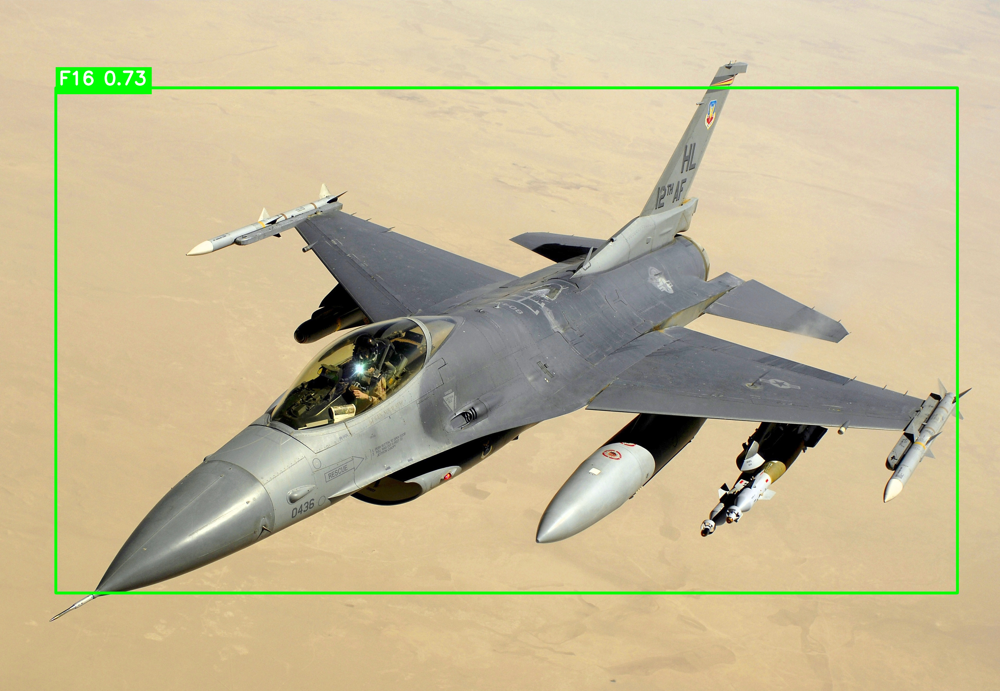

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F16_F-16_1_pred_20251223_123612.jpg 

--- F16 | F-16_2.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 2

01) F18   score=0.818  box=[150.8,75.2,492.6,214.2]  (w=341.9, h=139.0, area=47520)
02) F16   score=0.703  box=[156.3,76.6,491.8,211.6]  (w=335.5, h=135.1, area=45314)


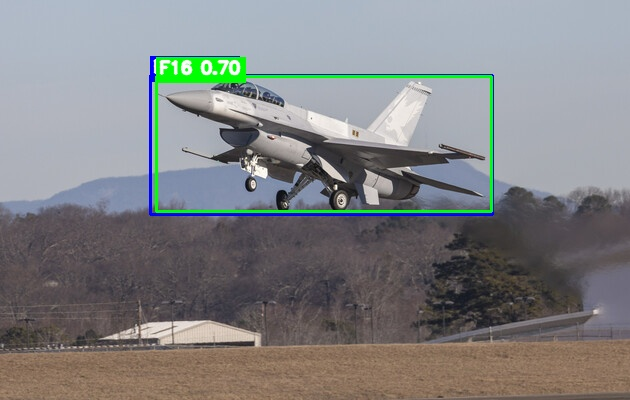

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F16_F-16_2_pred_20251223_123612.jpg 

--- F16 | F-16_3.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 1

01) F16   score=0.854  box=[66.9,117.5,705.7,328.4]  (w=638.8, h=210.9, area=134744)


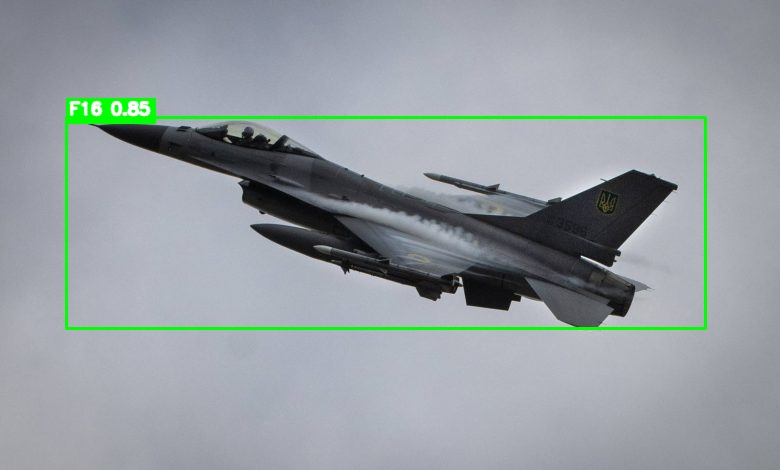

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F16_F-16_3_pred_20251223_123612.jpg 

--- F16 | F-16_4.jpg ---
Toplam tespit: 4 | Thr(0.3) sonrası: 1

01) F16   score=0.951  box=[287.7,743.5,4890.4,3133.7]  (w=4602.8, h=2390.3, area=11001830)


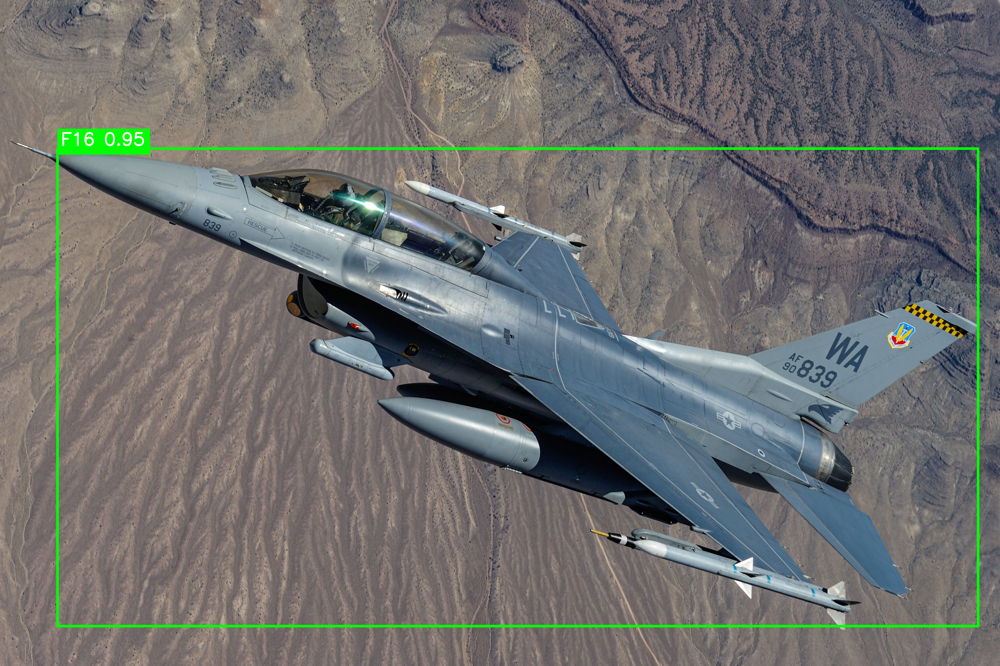

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F16_F-16_4_pred_20251223_123613.jpg 



In [5]:
from glob import glob
from pathlib import Path

import cv2
import numpy as np
from datetime import datetime
from IPython.display import Image as IPImage, display

from mmdet.apis import inference_detector


# ---------------------------------------------------------
# Dinamik çizim yardımcıları
# ---------------------------------------------------------
def compute_draw_params(w: int, h: int):
    """
    Görüntü boyutuna göre çizim parametrelerini ölçekler.
    short=800 referans alınır.
    """
    short = min(w, h)
    scale = max(0.8, short / 800.0)

    box_th = max(2, int(round(3 * scale)))
    font_scale = 0.7 * scale
    text_th = max(1, int(round(2 * scale)))
    pad = max(2, int(round(4 * scale)))
    return box_th, font_scale, text_th, pad


def draw_boxes_opencv(img_bgr, bboxes, scores, labels, class_names, score_thr=0.30):
    """
    OpenCV ile bbox + label + score çizer.
    - Dinamik thickness/font
    - Yazı arkaplan kutulu (kontrast garanti)
    - Skora göre sıralı çizim
    """
    h, w = img_bgr.shape[:2]
    BOX_TH, FONT_SCALE, TEXT_TH, PAD = compute_draw_params(w, h)

    keep = scores >= score_thr
    bboxes_k = bboxes[keep]
    scores_k = scores[keep]
    labels_k = labels[keep]

    palette = [
        (0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0),
        (255, 0, 255), (0, 255, 255)
    ]

    def safe_name(lb: int) -> str:
        if class_names is None:
            return str(lb)
        return class_names[lb] if lb < len(class_names) else str(lb)

    def color_for_label(lb: int):
        return palette[int(lb) % len(palette)]

    draw = img_bgr.copy()

    # yüksek skor üstte çizilsin
    order = np.argsort(-scores_k) if len(scores_k) else []

    for idx in order:
        x1, y1, x2, y2 = map(int, bboxes_k[idx])
        sc = float(scores_k[idx])
        lb = int(labels_k[idx])

        color = color_for_label(lb)
        cv2.rectangle(draw, (x1, y1), (x2, y2), color, thickness=BOX_TH)

        text = f"{safe_name(lb)} {sc:.2f}"
        (tw, th), baseline = cv2.getTextSize(
            text, cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, TEXT_TH
        )

        # label kutusu kadraj dışına taşmasın
        x_text = max(0, x1)
        y_text = max(y1, th + PAD + 2)

        # arkaplan kutusu
        cv2.rectangle(
            draw,
            (x_text, y_text - th - PAD * 2),
            (x_text + tw + PAD * 2, y_text + baseline),
            color,
            thickness=-1
        )

        # yazı
        cv2.putText(
            draw,
            text,
            (x_text + PAD, y_text - PAD),
            cv2.FONT_HERSHEY_SIMPLEX,
            FONT_SCALE,
            (255, 255, 255),
            thickness=TEXT_TH,
            lineType=cv2.LINE_AA
        )

    return draw


# ---------------------------------------------------------
# Ayarlar
# ---------------------------------------------------------
TARGET = "F16"  # sadece dosya isimlendirme / log amaçlı
SCORE_THR = 0.30

# notebook çok şişmesin diye (None yaparsan hepsini gösterir)
MAX_SHOW = 10

in_dir = Path(r"C:/Users/omerf/Desktop/jet_detection_project/testing/input_test/F16_test")
out_dir = Path(r"C:/Users/omerf/Desktop/jet_detection_project/testing/output_test")
out_dir.mkdir(parents=True, exist_ok=True)

img_paths = sorted(glob(str(in_dir / "*.jpg")) + glob(str(in_dir / "*.png")))

print(f"Running test for: {TARGET}")
print("IN :", in_dir)
print("OUT:", out_dir)

if not img_paths:
    print("No images found in", in_dir)
else:
    print(f"Found {len(img_paths)} images. Running detection...\n")


# class isimleri
if hasattr(model, "dataset_meta") and model.dataset_meta is not None:
    class_names = model.dataset_meta.get("classes", None)
else:
    class_names = ("F16", "F18", "F22", "F35")


# ---------------------------------------------------------
# Batch inference + OpenCV dinamik çizim
# ---------------------------------------------------------
shown = 0

for img_path_str in img_paths:
    img_path = Path(img_path_str)

    # 1) Inference
    result = inference_detector(model, str(img_path))

    # 2) Metin çıktısı (sağlam + skora göre sıralı)
    pred = result.pred_instances
    bboxes = pred.bboxes.detach().cpu().numpy()              # (N,4)
    scores = pred.scores.detach().cpu().numpy()              # (N,)
    labels = pred.labels.detach().cpu().numpy().astype(int)  # (N,)

    keep = scores >= SCORE_THR
    bboxes_k = bboxes[keep]
    scores_k = scores[keep]
    labels_k = labels[keep]

    print(f"--- {TARGET} | {img_path.name} ---")
    print(f"Toplam tespit: {len(scores)} | Thr({SCORE_THR}) sonrası: {len(scores_k)}\n")

    order = np.argsort(-scores_k) if len(scores_k) else []
    for i, idx in enumerate(order, 1):
        x1, y1, x2, y2 = bboxes_k[idx]
        sc = float(scores_k[idx])
        lb = int(labels_k[idx])
        w = x2 - x1
        h = y2 - y1
        area = w * h
        name = class_names[lb] if (class_names is not None and lb < len(class_names)) else str(lb)
        print(
            f"{i:02d}) {name:<4}  score={sc:.3f}  "
            f"box=[{x1:.1f},{y1:.1f},{x2:.1f},{y2:.1f}]  "
            f"(w={w:.1f}, h={h:.1f}, area={area:.0f})"
        )

    # 3) OpenCV ile dinamik çiz + kaydet
    img_bgr = cv2.imread(str(img_path))
    if img_bgr is None:
        print(f"[WARN] Görüntü okunamadı, atlandı: {img_path}\n")
        continue

    draw = draw_boxes_opencv(
        img_bgr=img_bgr,
        bboxes=bboxes,
        scores=scores,
        labels=labels,
        class_names=class_names,
        score_thr=SCORE_THR
    )

    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    out_file = out_dir / f"{TARGET}_{img_path.stem}_pred_{ts}.jpg"
    cv2.imwrite(str(out_file), draw)

    # 4) Notebook display (limitli)
    if MAX_SHOW is None or shown < MAX_SHOW:
        display(IPImage(filename=str(out_file)))
        shown += 1

    print("Saved:", out_file, "\n")


Running test for: F18
Found 4 images. Running detection...

--- F18 | F-18_2.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 1

01) F18   score=0.976  box=[101.8,98.0,957.0,572.4]  (w=855.2, h=474.5, area=405779)


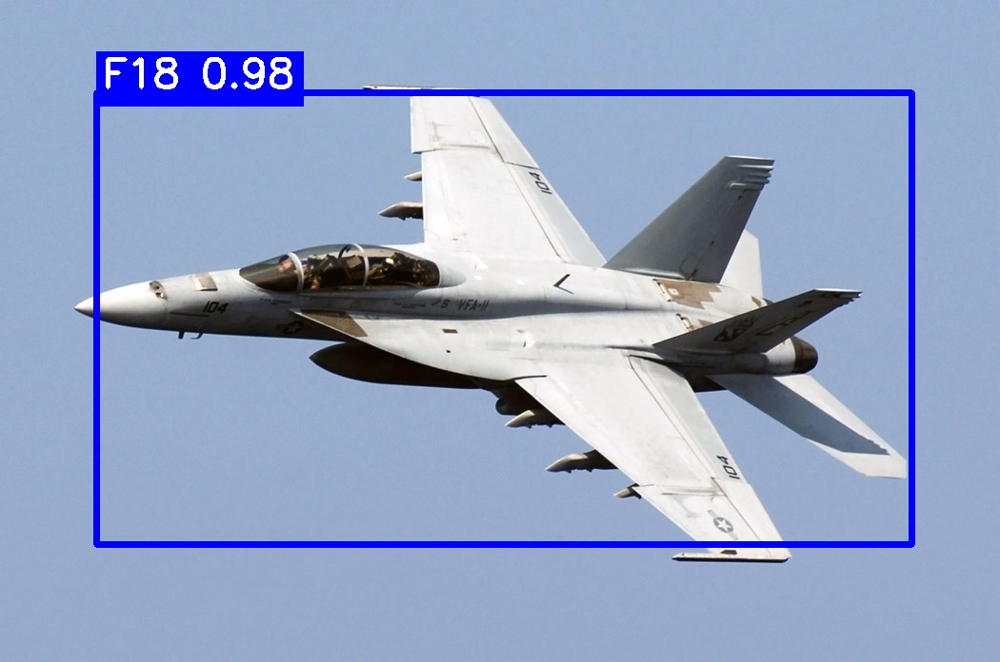

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F18_F-18_2_pred_20251223_123739.jpg 

--- F18 | F-18_3.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 1

01) F18   score=0.693  box=[134.2,864.7,3244.2,2073.4]  (w=3110.1, h=1208.6, area=3758916)


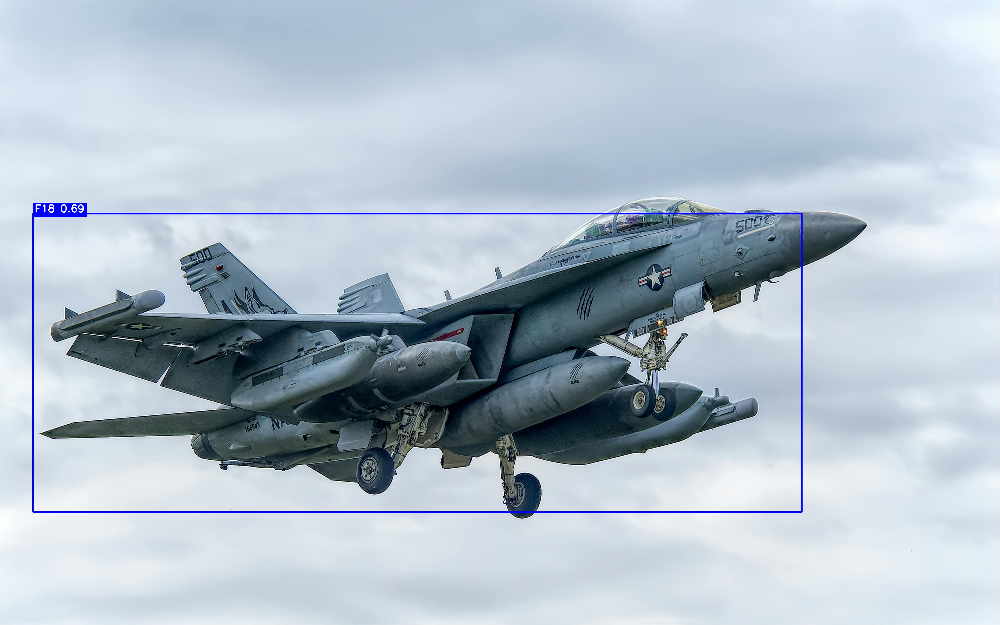

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F18_F-18_3_pred_20251223_123739.jpg 

--- F18 | F-18_4.jpg ---
Toplam tespit: 1 | Thr(0.3) sonrası: 1

01) F18   score=0.971  box=[151.4,405.0,3094.2,1155.0]  (w=2942.8, h=750.0, area=2207074)


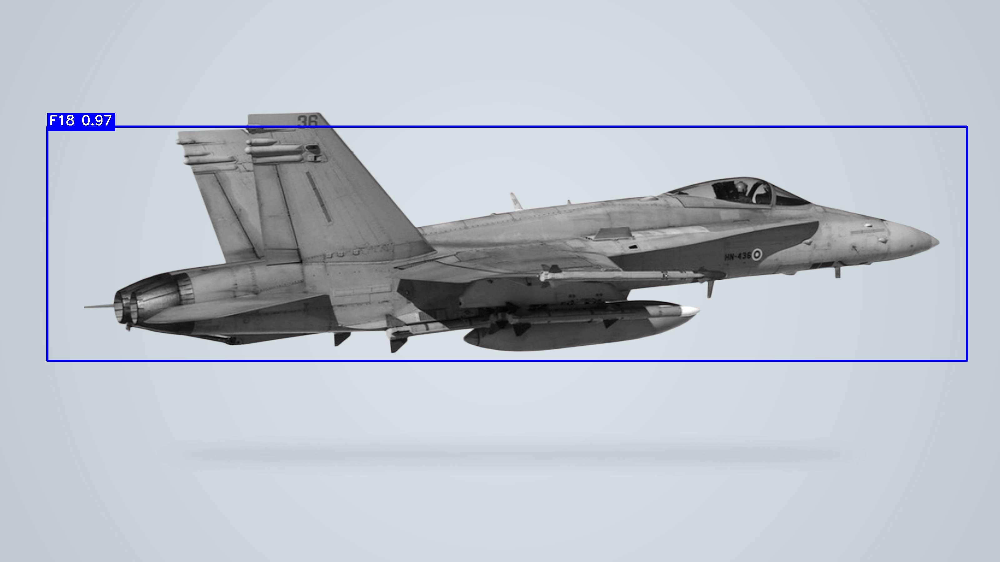

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F18_F-18_4_pred_20251223_123740.jpg 

--- F18 | F18_1.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 1

01) F18   score=0.905  box=[38.0,31.4,765.6,460.6]  (w=727.5, h=429.3, area=312324)


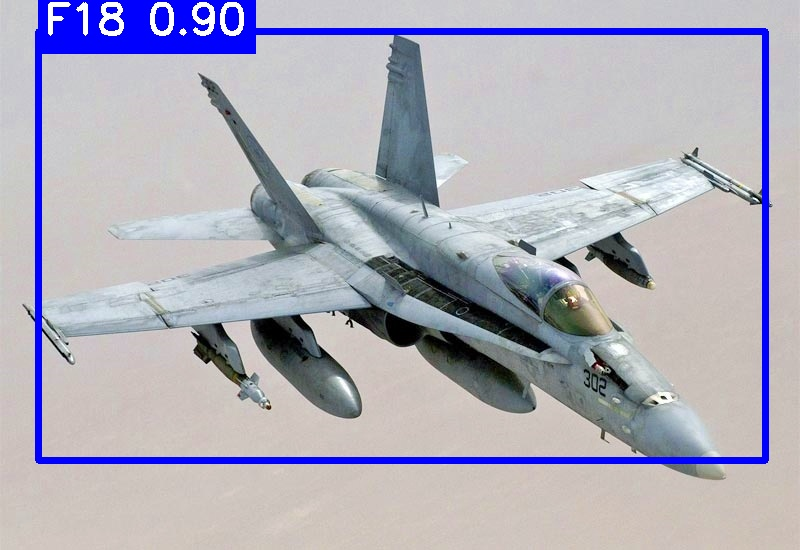

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F18_F18_1_pred_20251223_123740.jpg 



In [6]:
from glob import glob
import cv2
import numpy as np
from datetime import datetime
from IPython.display import Image as IPImage, display

print("Running test for: F18")

in_dir = Path(r"""C:/Users/omerf/Desktop/jet_detection_project/testing/input_test/F18_test""")
out_dir = Path(r"""C:/Users/omerf/Desktop/jet_detection_project/testing/output_test""")
img_paths = sorted(glob(str(in_dir / "*.jpg")) + glob(str(in_dir / "*.png")))

if not img_paths:
    print("No images found in", in_dir)
else:
    print(f"Found {len(img_paths)} images. Running detection...\n")

for img_path_str in img_paths:
    img_path = Path(img_path_str)
    result = inference_detector(model, str(img_path))

    pred = result.pred_instances
    bboxes = pred.bboxes.detach().cpu().numpy()
    scores = pred.scores.detach().cpu().numpy()
    labels = pred.labels.detach().cpu().numpy().astype(int)

    SCORE_THR = 0.30
    keep = scores >= SCORE_THR
    bboxes_k = bboxes[keep]
    scores_k = scores[keep]
    labels_k = labels[keep]

    class_names = model.dataset_meta.get("classes", ["F16", "F18", "F22", "F35"])
    def safe_name(lb): return class_names[lb] if lb < len(class_names) else str(lb)

    print(f"--- F18 | {img_path.name} ---")
    print(f"Toplam tespit: {len(scores)} | Thr({SCORE_THR}) sonrası: {len(scores_k)}\n")
    for i, (bb, sc, lb) in enumerate(zip(bboxes_k, scores_k, labels_k), 1):
        x1, y1, x2, y2 = bb
        name = safe_name(lb)
        w = x2 - x1
        h = y2 - y1
        area = w * h
        print(f"{i:02d}) {name:<4}  score={sc:.3f}  box=[{x1:.1f},{y1:.1f},{x2:.1f},{y2:.1f}]  (w={w:.1f}, h={h:.1f}, area={area:.0f})")

    img = cv2.imread(str(img_path))
    draw = img.copy()
    palette = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255)]
    def color_for_label(lb): return palette[lb % len(palette)]

    BOX_THICKNESS = 6
    FONT_SCALE = 1.4
    TEXT_THICKNESS = 3
    PAD = 6

    order = np.argsort(-scores_k) if len(scores_k) else []
    for idx in order:
        bb = bboxes_k[idx]
        sc = float(scores_k[idx])
        lb = int(labels_k[idx])
        x1, y1, x2, y2 = map(int, bb)
        color = color_for_label(lb)
        cv2.rectangle(draw, (x1, y1), (x2, y2), color, thickness=BOX_THICKNESS)
        text = f"{safe_name(lb)} {sc:.2f}"
        (tw, th), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, TEXT_THICKNESS)
        y_text = max(y1, th + PAD + 2)
        cv2.rectangle(draw, (x1, y_text - th - PAD*2), (x1 + tw + PAD*2, y_text + baseline), color, thickness=-1)
        cv2.putText(draw, text, (x1 + PAD, y_text - PAD), cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, (255, 255, 255), thickness=TEXT_THICKNESS)

    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    out_file = out_dir / f"F18_{img_path.stem}_pred_{ts}.jpg"
    cv2.imwrite(str(out_file), draw)
    display(IPImage(filename=str(out_file)))
    print("Saved:", out_file, "\n")

Running test for: F22
Found 4 images. Running detection...

--- F22 | F-22_1.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 2

01) F22   score=0.753  box=[161.8,111.4,1914.4,1147.9]  (w=1752.6, h=1036.5, area=1816492)
02) F35   score=0.442  box=[151.1,120.8,1922.2,1135.7]  (w=1771.1, h=1014.9, area=1797447)


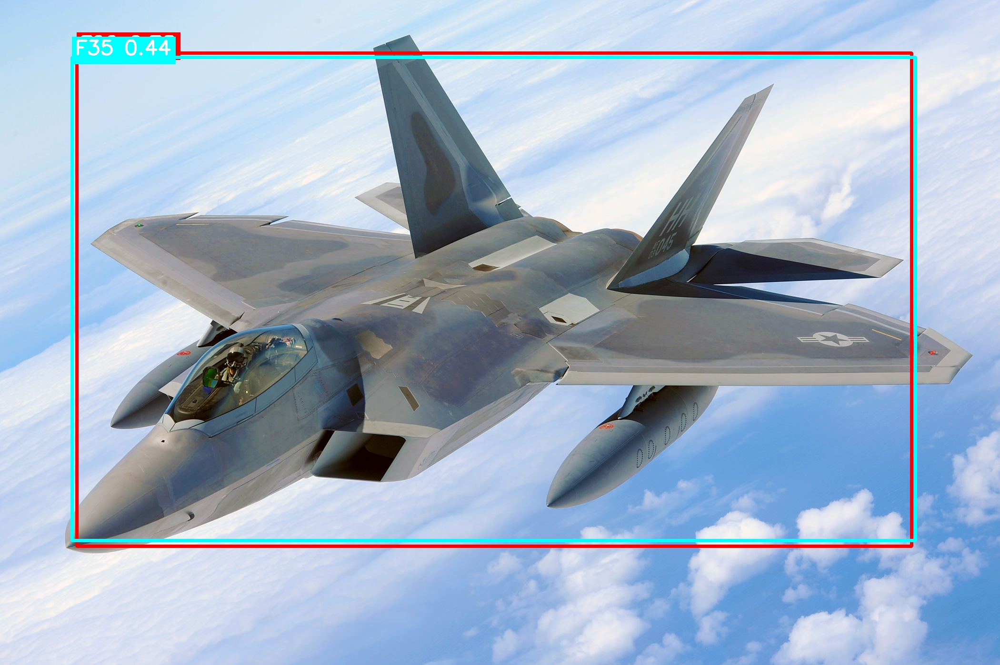

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F22_F-22_1_pred_20251223_123807.jpg 

--- F22 | F-22_2.jpg ---
Toplam tespit: 3 | Thr(0.3) sonrası: 2

01) F35   score=0.803  box=[60.3,69.2,1108.5,861.4]  (w=1048.2, h=792.2, area=830390)
02) F22   score=0.404  box=[54.3,73.8,1105.5,859.5]  (w=1051.2, h=785.6, area=825852)


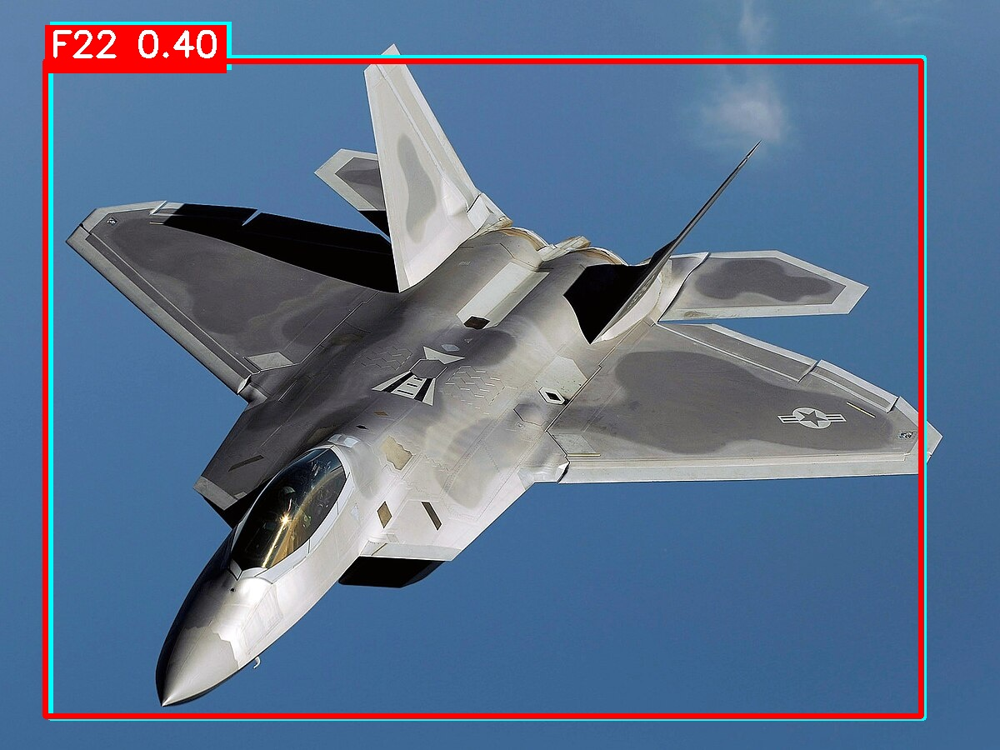

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F22_F-22_2_pred_20251223_123807.jpg 

--- F22 | F-22_3.jpg ---
Toplam tespit: 3 | Thr(0.3) sonrası: 2

01) F35   score=0.642  box=[202.1,60.2,1754.0,1249.9]  (w=1552.0, h=1189.7, area=1846422)
02) F22   score=0.533  box=[203.3,78.0,1760.7,1220.8]  (w=1557.4, h=1142.8, area=1779852)


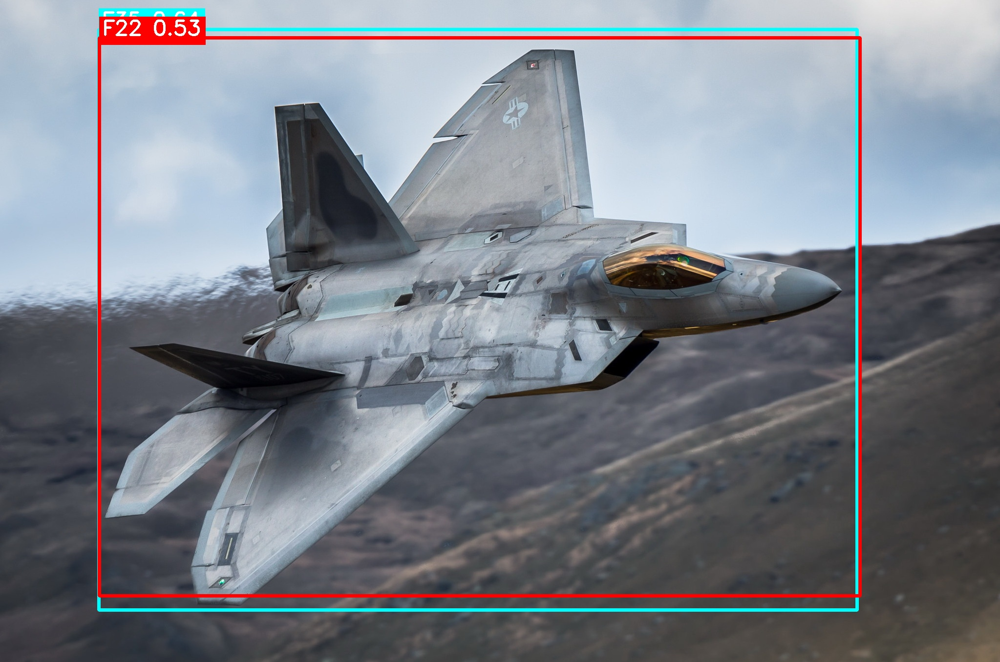

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F22_F-22_3_pred_20251223_123807.jpg 

--- F22 | F-22_4.jpg ---
Toplam tespit: 4 | Thr(0.3) sonrası: 3

01) F22   score=0.844  box=[177.8,293.2,1259.0,606.8]  (w=1081.2, h=313.6, area=339075)
02) F22   score=0.791  box=[98.5,187.1,760.2,373.2]  (w=661.7, h=186.1, area=123133)
03) F35   score=0.566  box=[93.5,188.1,759.6,373.7]  (w=666.1, h=185.6, area=123611)


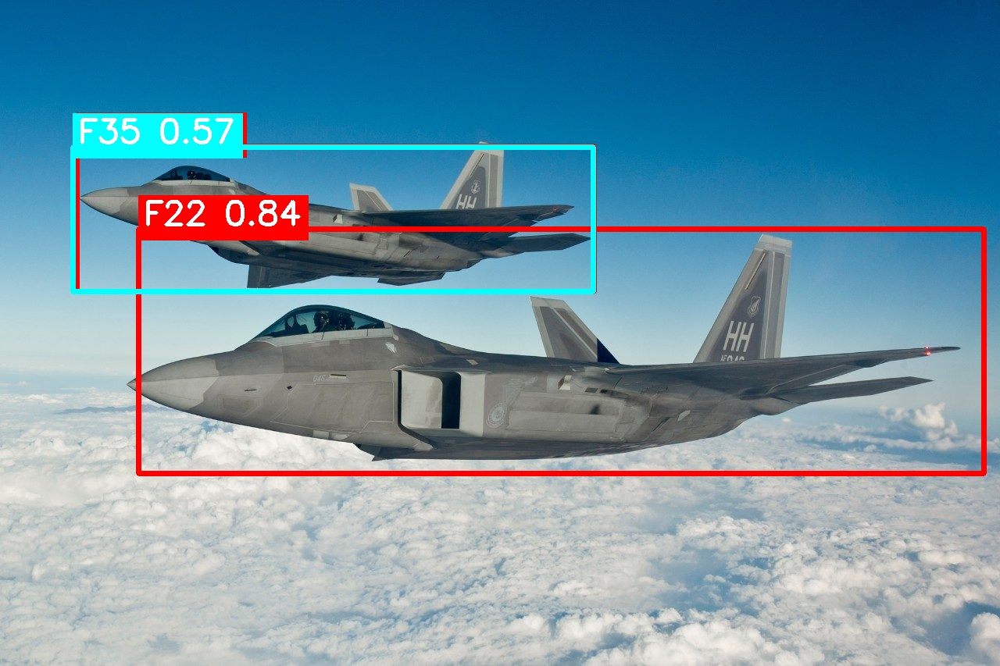

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F22_F-22_4_pred_20251223_123808.jpg 



In [7]:
from glob import glob
import cv2
import numpy as np
from datetime import datetime
from IPython.display import Image as IPImage, display

print("Running test for: F22")

in_dir = Path(r"""C:/Users/omerf/Desktop/jet_detection_project/testing/input_test/F22_test""")
out_dir = Path(r"""C:/Users/omerf/Desktop/jet_detection_project/testing/output_test""")
img_paths = sorted(glob(str(in_dir / "*.jpg")) + glob(str(in_dir / "*.png")))

if not img_paths:
    print("No images found in", in_dir)
else:
    print(f"Found {len(img_paths)} images. Running detection...\n")

for img_path_str in img_paths:
    img_path = Path(img_path_str)
    result = inference_detector(model, str(img_path))

    pred = result.pred_instances
    bboxes = pred.bboxes.detach().cpu().numpy()
    scores = pred.scores.detach().cpu().numpy()
    labels = pred.labels.detach().cpu().numpy().astype(int)

    SCORE_THR = 0.30
    keep = scores >= SCORE_THR
    bboxes_k = bboxes[keep]
    scores_k = scores[keep]
    labels_k = labels[keep]

    class_names = model.dataset_meta.get("classes", ["F16", "F18", "F22", "F35"])
    def safe_name(lb): return class_names[lb] if lb < len(class_names) else str(lb)

    print(f"--- F22 | {img_path.name} ---")
    print(f"Toplam tespit: {len(scores)} | Thr({SCORE_THR}) sonrası: {len(scores_k)}\n")
    for i, (bb, sc, lb) in enumerate(zip(bboxes_k, scores_k, labels_k), 1):
        x1, y1, x2, y2 = bb
        name = safe_name(lb)
        w = x2 - x1
        h = y2 - y1
        area = w * h
        print(f"{i:02d}) {name:<4}  score={sc:.3f}  box=[{x1:.1f},{y1:.1f},{x2:.1f},{y2:.1f}]  (w={w:.1f}, h={h:.1f}, area={area:.0f})")

    img = cv2.imread(str(img_path))
    draw = img.copy()
    palette = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255)]
    def color_for_label(lb): return palette[lb % len(palette)]

    BOX_THICKNESS = 6
    FONT_SCALE = 1.4
    TEXT_THICKNESS = 3
    PAD = 6

    order = np.argsort(-scores_k) if len(scores_k) else []
    for idx in order:
        bb = bboxes_k[idx]
        sc = float(scores_k[idx])
        lb = int(labels_k[idx])
        x1, y1, x2, y2 = map(int, bb)
        color = color_for_label(lb)
        cv2.rectangle(draw, (x1, y1), (x2, y2), color, thickness=BOX_THICKNESS)
        text = f"{safe_name(lb)} {sc:.2f}"
        (tw, th), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, TEXT_THICKNESS)
        y_text = max(y1, th + PAD + 2)
        cv2.rectangle(draw, (x1, y_text - th - PAD*2), (x1 + tw + PAD*2, y_text + baseline), color, thickness=-1)
        cv2.putText(draw, text, (x1 + PAD, y_text - PAD), cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, (255, 255, 255), thickness=TEXT_THICKNESS)

    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    out_file = out_dir / f"F22_{img_path.stem}_pred_{ts}.jpg"
    cv2.imwrite(str(out_file), draw)
    display(IPImage(filename=str(out_file)))
    print("Saved:", out_file, "\n")

Running test for: F35
Found 4 images. Running detection...

--- F35 | F-35_1.jpg ---
Toplam tespit: 1 | Thr(0.3) sonrası: 1

01) F35   score=0.995  box=[103.8,221.7,1089.8,538.7]  (w=986.1, h=317.0, area=312617)


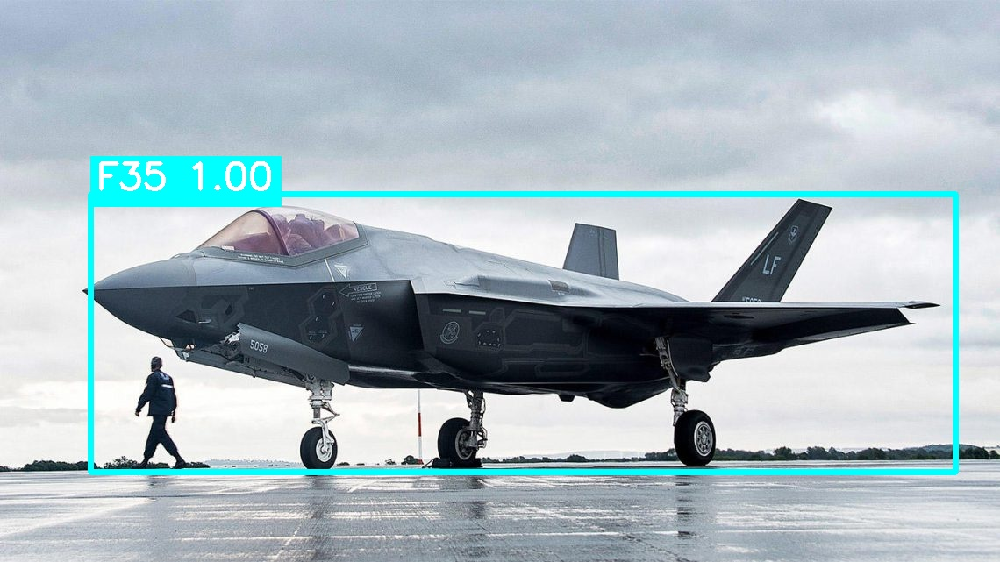

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F35_F-35_1_pred_20251223_123835.jpg 

--- F35 | F-35_2.jpg ---
Toplam tespit: 2 | Thr(0.3) sonrası: 1

01) F35   score=0.922  box=[156.0,371.1,3386.7,2168.0]  (w=3230.7, h=1796.8, area=5804985)


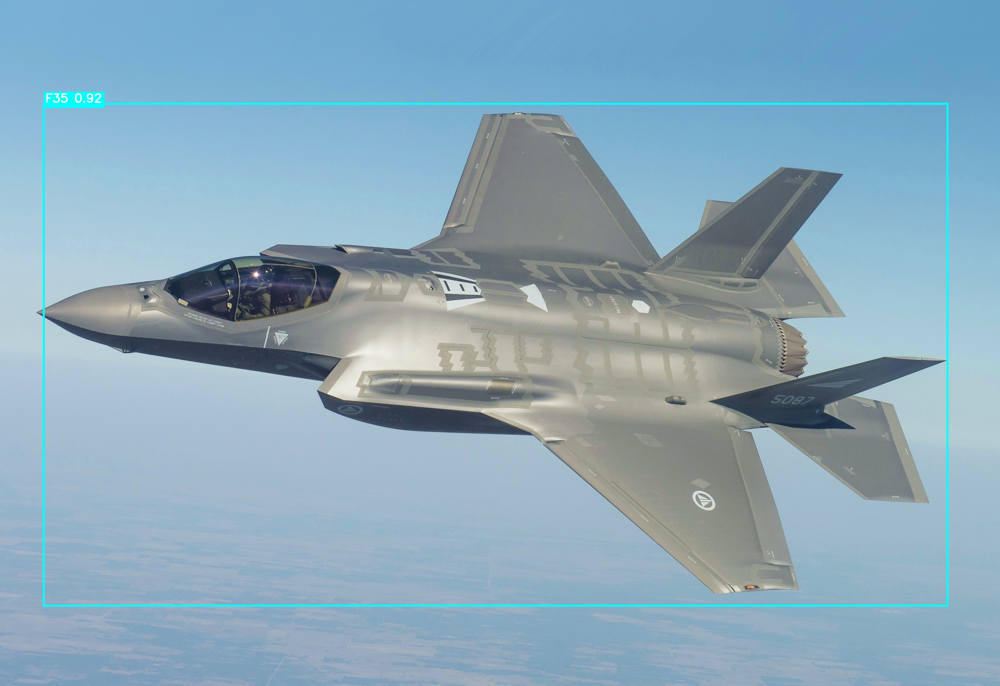

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F35_F-35_2_pred_20251223_123835.jpg 

--- F35 | F-35_3.jpg ---
Toplam tespit: 5 | Thr(0.3) sonrası: 1

01) F35   score=0.449  box=[0.0,112.1,780.0,364.0]  (w=780.0, h=252.0, area=196536)


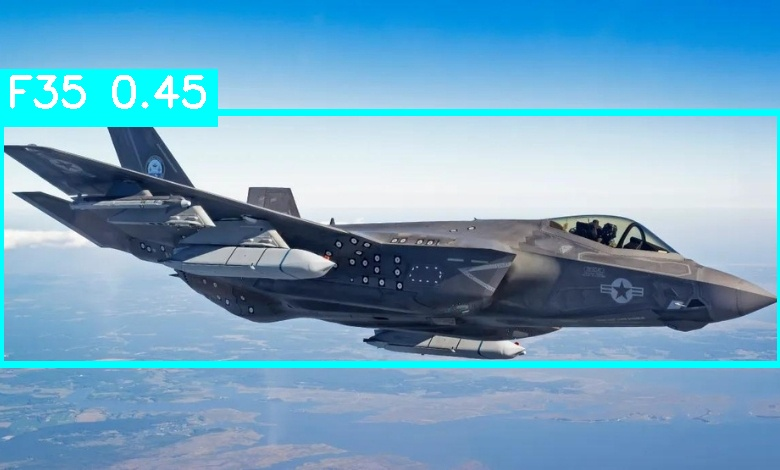

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F35_F-35_3_pred_20251223_123835.jpg 

--- F35 | F-35_4.jpg ---
Toplam tespit: 3 | Thr(0.3) sonrası: 1

01) F35   score=0.834  box=[2.7,54.3,284.0,140.6]  (w=281.3, h=86.3, area=24272)


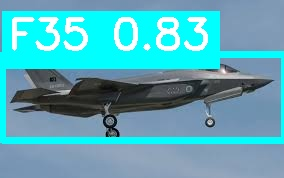

Saved: C:\Users\omerf\Desktop\jet_detection_project\testing\output_test\F35_F-35_4_pred_20251223_123836.jpg 



In [8]:
from glob import glob
import cv2
import numpy as np
from datetime import datetime
from IPython.display import Image as IPImage, display

print("Running test for: F35")

in_dir = Path(r"""C:/Users/omerf/Desktop/jet_detection_project/testing/input_test/F35_test""")
out_dir = Path(r"""C:/Users/omerf/Desktop/jet_detection_project/testing/output_test""")
img_paths = sorted(glob(str(in_dir / "*.jpg")) + glob(str(in_dir / "*.png")))

if not img_paths:
    print("No images found in", in_dir)
else:
    print(f"Found {len(img_paths)} images. Running detection...\n")

for img_path_str in img_paths:
    img_path = Path(img_path_str)
    result = inference_detector(model, str(img_path))

    pred = result.pred_instances
    bboxes = pred.bboxes.detach().cpu().numpy()
    scores = pred.scores.detach().cpu().numpy()
    labels = pred.labels.detach().cpu().numpy().astype(int)

    SCORE_THR = 0.30
    keep = scores >= SCORE_THR
    bboxes_k = bboxes[keep]
    scores_k = scores[keep]
    labels_k = labels[keep]

    class_names = model.dataset_meta.get("classes", ["F16", "F18", "F22", "F35"])
    def safe_name(lb): return class_names[lb] if lb < len(class_names) else str(lb)

    print(f"--- F35 | {img_path.name} ---")
    print(f"Toplam tespit: {len(scores)} | Thr({SCORE_THR}) sonrası: {len(scores_k)}\n")
    for i, (bb, sc, lb) in enumerate(zip(bboxes_k, scores_k, labels_k), 1):
        x1, y1, x2, y2 = bb
        name = safe_name(lb)
        w = x2 - x1
        h = y2 - y1
        area = w * h
        print(f"{i:02d}) {name:<4}  score={sc:.3f}  box=[{x1:.1f},{y1:.1f},{x2:.1f},{y2:.1f}]  (w={w:.1f}, h={h:.1f}, area={area:.0f})")

    img = cv2.imread(str(img_path))
    draw = img.copy()
    palette = [(0, 255, 0), (255, 0, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255), (0, 255, 255)]
    def color_for_label(lb): return palette[lb % len(palette)]

    BOX_THICKNESS = 6
    FONT_SCALE = 1.4
    TEXT_THICKNESS = 3
    PAD = 6

    order = np.argsort(-scores_k) if len(scores_k) else []
    for idx in order:
        bb = bboxes_k[idx]
        sc = float(scores_k[idx])
        lb = int(labels_k[idx])
        x1, y1, x2, y2 = map(int, bb)
        color = color_for_label(lb)
        cv2.rectangle(draw, (x1, y1), (x2, y2), color, thickness=BOX_THICKNESS)
        text = f"{safe_name(lb)} {sc:.2f}"
        (tw, th), baseline = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, TEXT_THICKNESS)
        y_text = max(y1, th + PAD + 2)
        cv2.rectangle(draw, (x1, y_text - th - PAD*2), (x1 + tw + PAD*2, y_text + baseline), color, thickness=-1)
        cv2.putText(draw, text, (x1 + PAD, y_text - PAD), cv2.FONT_HERSHEY_SIMPLEX, FONT_SCALE, (255, 255, 255), thickness=TEXT_THICKNESS)

    ts = datetime.now().strftime("%Y%m%d_%H%M%S")
    out_file = out_dir / f"F35_{img_path.stem}_pred_{ts}.jpg"
    cv2.imwrite(str(out_file), draw)
    display(IPImage(filename=str(out_file)))
    print("Saved:", out_file, "\n")